# Image Annotation with Feature Matching and Homography

In [ ]:
#------------------------------------------------------------------------------------------------------------

In this notebook we implement a feature-based object detection pipeline to quickly annotate a dataset with homography:
1. extract keypoints from the reference and target images
2. compute descriptors that encode the visual appearance around each keypoint
3. match descriptors between the two images to find reliable correspondences
4. estimate a homography from the matched points
5. project the reference image corners through the homography to obtain a bounding box in the target image

### In a nutshell

**Keypoints** are distinct locations in an image (corners, textured areas, etc) that can be detected under changes in viewpoint or scale.
**Descriptors** are vectors describing the local patch around each keypoint. They allow comparing keypoints across different images.
There are different ways to extract keypoints and descriptors.
- **ORB** produces binary descriptors (strings of bits, typically 256-bit). Binary descriptors represent features as a sequence of 0/1 choices from intensity tests.
- **SIFT** produces float descriptors (128-dim vectors of numbers). They describe the pattern of gradients around a keypoint. Gradients are changes in brightness or color in a particular direction (they show where edges and textures are).

Once the descriptors are computed for two images, they are compared to find the corresponding points.
- ORB uses **Hamming distance** to compare descriptors. Hamming distance is the correct distance metric for binary strings, since counts how many bits differ.
- SIFT uses **FLANN** (fast library for approximate nearest neighobrs) to compare descriptors. For float vectors, the similarity is measured using the Euclidean (L2) distance.

With enough reliable matches, we estimate a 3x3 projective transformation (**homography**) using **RANSAC**, a method to find reliable model even when the data contains misktakes or outliers. This matrix maps points from the reference image to the target image. Applying it to the four corners of the reference image produces the projected quadrilateral, which becomes the detected bounding box.

In [1]:
%%capture
!wget https://huggingface.co/datasets/paulinamoskwa/72-imgs-book-and-reference/resolve/main/data.zip
!unzip data.zip -d data

In [2]:
import cv2
import numpy as np

MAX_NUM_FEATURES = 2_000_000_000

# ---------------------------
# Keypoints and descriptors
# ---------------------------

def get_orb_keypoints_and_descriptors(img: np.ndarray) -> tuple[list[cv2.KeyPoint], np.ndarray]:
    orb = cv2.ORB_create(MAX_NUM_FEATURES)
    keypoints, descriptors = orb.detectAndCompute(img, None)
    return keypoints, descriptors

def get_sift_keypoints_and_descriptors(img: np.ndarray) -> tuple[list[cv2.KeyPoint], np.ndarray]:
    sift = cv2.SIFT_create(MAX_NUM_FEATURES)
    keypoints, descriptors = sift.detectAndCompute(img, None)
    return keypoints, descriptors

# ---------------------------
# Matching
# ---------------------------

def compute_orb_matches(descriptors1: np.ndarray, descriptors2: np.ndarray) -> list[cv2.DMatch]:
    matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
    matches = list(matcher.match(descriptors1, descriptors2, None))
    matches.sort(key = lambda x: x.distance, reverse = False)
    n_good_matches = int(len(matches) * 0.00003)
    good_matches = matches[:n_good_matches]
    return good_matches

def compute_sift_matches(descriptors1: np.ndarray, descriptors2: np.ndarray) -> list[cv2.DMatch]:
    index_params = dict(algorithm=2, trees=50)
    search_params = dict(checks=800)
    matcher = cv2.FlannBasedMatcher(index_params, search_params)
    matches = matcher.knnMatch(descriptors1, descriptors2, k=2)
    good_matches = []
    for m, n in matches:
        if m.distance < 0.67 * n.distance:
            good_matches.append(m)
    return good_matches

# ---------------------------
# Homography
# ---------------------------

def get_box_annotation_through_homography(
    ref: np.ndarray,
    keypoints_ref: list[cv2.KeyPoint],
    keypoints_img: list[cv2.KeyPoint],
    matches: list[cv2.DMatch]
) -> np.ndarray:
    # Extract location of good matches
    points_ref = np.zeros((len(matches), 2), dtype=np.float32)
    points_img = np.zeros((len(matches), 2), dtype=np.float32)
    for i, match in enumerate(matches):
        points_ref[i, :] = keypoints_ref[match.queryIdx].pt
        points_img[i, :] = keypoints_img[match.trainIdx].pt
    H, mask = cv2.findHomography(points_ref, points_img, cv2.RANSAC)
    h_ref, w_ref = ref.shape[:2]
    corners = np.array([[0, 0], [w_ref-1, 0], [w_ref-1, h_ref-1], [0, h_ref-1]], dtype=np.float32)
    corners = corners.reshape(-1, 1, 2)  # perspectiveTransform wants (N, 1, 2), where 1 is dummy dim
    corners_transformed = cv2.perspectiveTransform(corners, H)
    return corners_transformed

Processing images: 100%|██████████| 72/72 [1:53:50<00:00, 94.87s/it] 


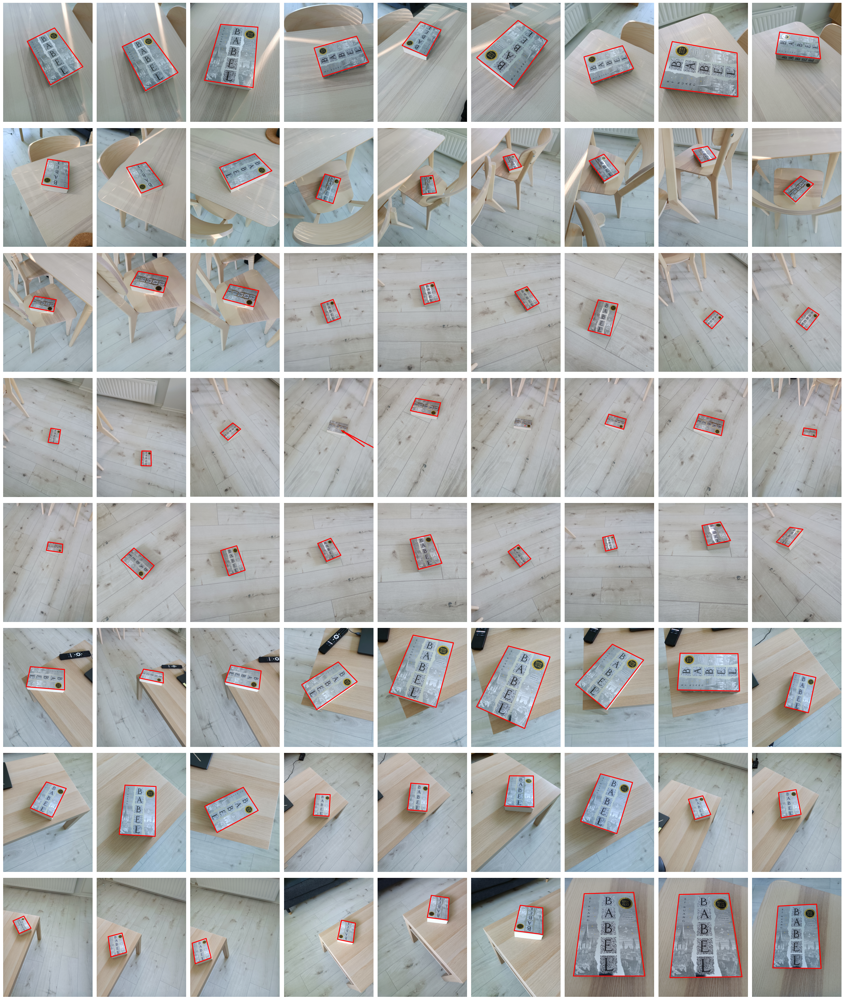

In [4]:
import os
import matplotlib.pyplot as plt
from tqdm import tqdm

ref_path = '/content/data/anchor.jpg'
ref = cv2.imread(ref_path, cv2.IMREAD_COLOR)
ref = cv2.cvtColor(ref, cv2.COLOR_BGR2RGB)
kp_ref, desc_ref = get_sift_keypoints_and_descriptors(ref)

results = []
data_dir = '/content/data'
for i in tqdm(range(1, 73), desc="Processing images"):
    img_path = os.path.join(data_dir, f"{i}.jpg")
    img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    kp_img, desc_img = get_sift_keypoints_and_descriptors(img)
    matches = compute_sift_matches(desc_ref, desc_img)
    corners_transformed = get_box_annotation_through_homography(ref, kp_ref, kp_img, matches)
    if corners_transformed is None:
        results.append(img)
        continue
    img_with_box = img.copy()
    corners_int = np.int32(corners_transformed).reshape(-1, 2)
    cv2.polylines(img_with_box, [corners_int], isClosed=True, color=(255, 0, 0), thickness=30)
    results.append(img_with_box)

fig, axes = plt.subplots(8, 9, figsize=(27, 32))
axes = axes.ravel()
for idx, ax in enumerate(axes):
    if idx < len(results):
        ax.imshow(results[idx])
        ax.axis("off")
    else:
        ax.axis("off")
plt.tight_layout()
plt.savefig('images_with_annotations.png')

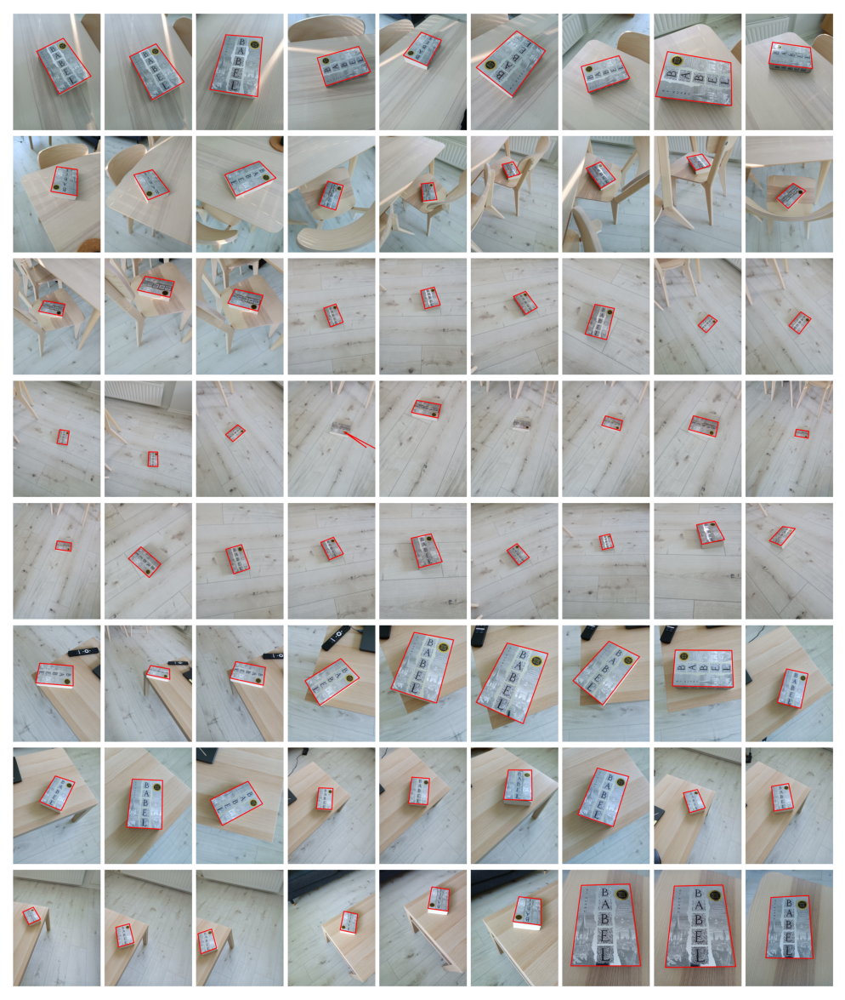

In [12]:
# Visualize output
out_img = cv2.imread("images_with_annotations.png", cv2.IMREAD_COLOR)
out_img = cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15, 15))
plt.imshow(out_img)
plt.axis("off")
plt.show()